# Assignment 5

**Submission deadline:**

**Problems 1 and 2 last lab session before or on Wednesday, 13.12.17**

**Problems 3 and bonuses last lab session before or on Wednesday, 20.12.17**

**Points: 10 + 4 bonus points**


## Downloading this notebook

This assignment is an Jupyter notebook. Download it by cloning https://github.com/janchorowski/nn_assignments. Follow the instructions in its README for instructions.

Please do not hesitate to use GitHub’s pull requests to send us corrections!

In [1]:
# Common imports

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
# Torch has to go first due to an importing bug
import torch

import collections

import numpy as np
import scipy.io
import scipy.ndimage

import PIL

import logging
logging.getLogger("PIL").setLevel(logging.INFO)

from torch import nn
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision

import common.plotting

In [3]:
import os
os.environ['TORCH_MODEL_ZOO'] =  os.environ['PYTORCH_DATA_PATH']

In [29]:
# We strongly recommend training using CUDA on lab computers
CUDA = True

def to_np(x):
    if isinstance(x, Variable):
        x = x.data
    return x.cpu().numpy()

def to_variable(x, **kwargs):
    x = torch.from_numpy(x)
    if CUDA:
        x = x.cuda()
    return Variable(x, **kwargs)

# Problem 1: Understanding the VGG network [4p]

In this task we will load a pre-trained model of the [VGG network](http://www.robots.ox.ac.uk/~vgg/research/very_deep/). It's a convolutional network developed at the Oxford University, trained on the [Imagenet Large Scale Visual Recognition Challenge 2012 (ILSVRC2012)](http://image-net.org/challenges/LSVRC/2012/) classificatiom dataset of 1.2 million training images of 1000 classes. A few VGG models of different depth have been proposed. The diagram below presents VGG16. Details of those models: [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556) by Simonyan and Zisserman.

![vgg16](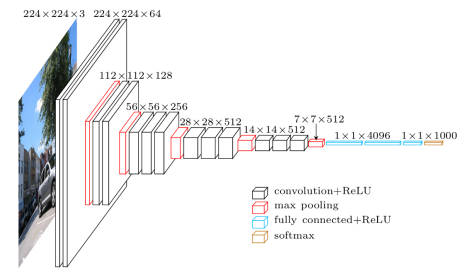
)

We will investigate how VGG classifies images, and 
try to build a deeper understanding of which parts of
a particular input image influence the output of the network.
We will start by simply occluding parts of the image
with a square of zeros anchored at point $(i, j)$ ,
and analyzing how the signal propagated through the network changes.
Becuase pre-processing for VGG requires to subtract the mean,
the most neutral occluding squares will appear grey when pre-processing is reversed.
Further reading: [Visualizing and Understanding Convolutional Networks](https://arxiv.org/abs/1311.2901)
by Zeiler and Fergus.

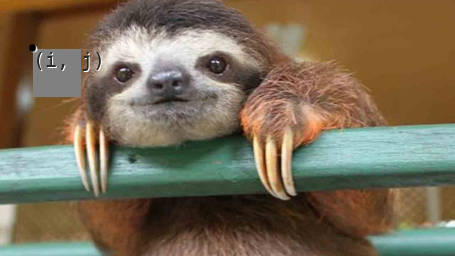

Let $X^{L:m}_{(k,l)}$ denote the input image tensor procesed by 
the $m$-th map of layer $L$,
where $(k, l)$ denote position in the map. To complete the assignment:
1. **[1p]** Load a pre-trained model of a VGG network (e.g., VGG-19) and inspect its architecture.
  Classify at least 5 images of your
  choice and plot them along with top-5 predictions returned by the network. We provide a mapping from
  numerical class labels to textual descriptions.
  It is vital to apply the same pre-processing as the one which has been used during network training.
2. **[2p]** Implement and test heatmaps generated by iteratively occluding parts of the input image.
  * Implement a data iterator which takes an input image and iteratively occludes part of the image with a
    rectangle (see sample image above).
  * Implement a function `layer_activations(x, layer_name)` of
    the VGG network class,
    which taps into the network and returns activations of a chosen layer. 
    For each occluding position $(i, j)$ in the input image, we can record 
    sum of activations of feature map $m$ in layer $L$ as a heatmap
    $h^{L:m}_{(i,j)} = \sum_{k,l} X^{L:m}_{(k,l)}$. Moving around the occluding rectangle
    changes the activations. Plot heatmaps $h^{L:m}$ for
    a few selected layers and images.
  * For each occluding position $(i, j)$ in the input image, we can record
    output probability of the true class $C$ and store it as $p(C|i,j)$.
    Plot such probability maps for a few images. Plot maps of network predictions
    $\text{argmax}_c p(c|i,j)$, which should reveal which occluding positions
    change the prediction of the network.
3. **[1p]** The method of [Integrated Gradients](https://arxiv.org/abs/1703.01365)
    allows to track which input pixels influence predictions of the network.
    Complete the code and run the method on a couple of examples.

In [5]:
import re
class ILSVRC2014Sample(object):
    """Mapper from numerical class IDs to their string LABELS and DESCRIPTIONS.
    
    Please use the dicts:
    - id_to_label and label_to_id to convert string labels and numerical ids
    - label_to_desc to get a textual description of a class label
    - id_to_desc to directly get descriptions for numerical IDs
    
    """
    def load_image(self, path):
        img = PIL.Image.open(path)
        img = img.convert('RGB')
        for t in self.transforms:
            img = t(img)
        return numpy.asarray(img).astype('float32') / 255.0
    
    def __init__(self, num=100):
        self.transforms = [
            torchvision.transforms.Scale(256),
            torchvision.transforms.CenterCrop(224)]
        
        base_dir = os.environ['PYTORCH_DATA_PATH'] + '/ILSVRC2014'
        devkit_dir = base_dir + '/ILSVRC2012_devkit_t12/data'
        
        meta = scipy.io.loadmat(devkit_dir + '/meta.mat')
        imagenet_class_names = []
        self.label_to_desc = {}
        for i in range(1000):
            self.label_to_desc[meta['synsets'][i][0][1][0]] = meta['synsets'][i][0][2][0]
            imagenet_class_names.append(meta['synsets'][i][0][1][0])
        
        img_names = sorted(os.listdir(base_dir + '/ILSVRC2012_img_val'))[:num]
        img_ids = {int(re.search('\d{8}', name).group()) for name in img_names}
        with open(devkit_dir + '/ILSVRC2012_validation_ground_truth.txt', 'r') as f:
            self.labels = [imagenet_class_names[int(line.strip()) - 1] \
                           for i, line in enumerate(f) if i+1 in img_ids]
        self.data = [self.load_image(base_dir + '/ILSVRC2012_img_val/' + name)
                     for name in img_names]
        
        self.id_to_label = sorted(self.label_to_desc.keys())
        self.label_to_id = {}
        self.id_to_desc = []
        for id_, label in enumerate(self.id_to_label):
            self.label_to_id[label] = id_
            self.id_to_desc.append(self.label_to_desc[label])

In [6]:
a = torch.randn(6, 3, 4, 5)
a


(0 ,0 ,.,.) = 
 -0.7063 -0.9783 -0.3517 -0.2987 -0.1951
 -0.0386  0.7013  1.2729 -0.2436  2.6822
  0.9720 -0.7328 -1.1021 -1.1757 -0.3632
  1.5430  0.1997 -1.7283 -0.3475 -0.5009

(0 ,1 ,.,.) = 
  0.1014 -0.7188  0.6934  0.2863 -0.6934
  0.0586  0.2190  0.5541 -1.7938 -1.6821
 -0.6282 -0.4132  1.1199  0.7624 -0.9241
 -0.4150  0.9256 -0.7392  0.8393 -0.4354

(0 ,2 ,.,.) = 
 -0.5134 -1.8466  2.0968 -0.8688  0.0665
 -0.2602 -0.0058 -0.5153  0.0952  0.5079
 -1.8043 -0.4813 -0.3491 -1.3620  0.6935
  1.0009  0.1610  0.6840 -0.3153 -0.0209

(1 ,0 ,.,.) = 
 -0.2706  0.6021 -0.4082  0.7083 -0.6989
 -0.2395  1.2533  0.1890 -1.3144  0.9044
 -0.3008 -0.9494  0.6055  1.4108  0.1369
 -0.3715  2.0295  0.9601  0.5119  0.8904

(1 ,1 ,.,.) = 
 -0.2176  0.6257 -1.8655  0.1393  0.8255
  0.6430 -0.0196  0.2735  1.2292  0.2067
 -0.7010 -1.2089  0.7375  1.3649  0.6226
  0.9011 -1.3772 -0.0219  0.2062  2.5817

(1 ,2 ,.,.) = 
  0.1809 -0.0530 -0.5583  0.8188 -1.0968
  0.5570  0.1200 -1.9732 -0.8574 -0.5031
  

In [149]:
bs, ch, w, h = a.size()

In [164]:
b = a.view(bs * ch, w * h)
b
c = torch.mm(b, b.t())
c.shape

torch.Size([18, 18])

In [ ]:
b = a.view

In [34]:
ll = ['a', 'b', 'v']
task = ['a', 'f', 'v', 'x']
for t in task: 
    if t in ll:
        print(t)

a
v


In [172]:
ll.append('vvv')
ll

['a', 'b', 'v', 'a', 'a', 'a', 'vvv', 'vvv']

In [30]:
#
# TODO: fill in the blanks in the VGG network. The function multi_layer_activations
# is only needed for the last homework.
#

class VGGPreprocess(torch.nn.Module):
    """Pytorch module that normalizes data for a VGG network
    """
    # These values are taken from http://pytorch.org/docs/master/torchvision/models.html
    RGB_MEANS = torch.FloatTensor([0.485, 0.456, 0.406])[None, :, None, None]
    RGB_STDS = torch.FloatTensor([0.229, 0.224, 0.225])[None, :, None, None]
    
    def forward(self, x):
        """Normalize a single image or a batch of images
        
        Args:
            x: a pytorch Variable containing and float32 RGB image tensor with 
              dimensions (batch_size x width x heigth x RGB_channels) or 
              (width x heigth x RGB_channels).
        Returns:
            a torch Variable containing a normalized BGR image with shape 
              (batch_size x BGR_channels x width x heigth)
        """
        if x.dim() == 3:
            x = torch.unsqueeze(x, 0)
        # x is batch * width * heigth *channels,  
        # make it batch * channels * width * heigth 
        if x.size(3) == 3:
            x = x.permute(0, 3, 1, 2)
        means = self.RGB_MEANS
        stds = self.RGB_STDS
        if x.is_cuda:
            means = means.cuda()
            stds = stds.cuda()
        x = (x - Variable(means)) / Variable(stds)
        return x

class VGG(torch.nn.Module):
    """Wrapper around a VGG network allowing convenient extraction of layer activations.
    
    """
    FEATURE_LAYER_NAMES = {
        'vgg16':
            ["conv1_1", "relu1_1", "conv1_2", "relu1_2", "pool1"
             "conv2_1", "relu2_1", "conv2_2", "relu2_2", "pool2"
             "conv3_1", "relu3_1", "conv3_2", "relu3_2", "conv3_3",
             "relu3_3", "pool3"
             "conv4_1", "relu4_1", "conv4_2", "relu4_2", "conv4_3",
             "relu4_3", "pool4"
             "conv5_1", "relu5_1", "conv5_2", "relu5_2", "conv5_3",
             "relu5_3", "pool5"],
        'vgg19':
            ["conv1_1", "relu1_1", "conv1_2", "relu1_2", "pool1",
             "conv2_1", "relu2_1", "conv2_2", "relu2_2", "pool2",
             "conv3_1", "relu3_1", "conv3_2", "relu3_2", "conv3_3",
             "relu3_3", "conv3_4", "relu3_4", "pool3",
             "conv4_1", "relu4_1", "conv4_2", "relu4_2",
             "conv4_3", "relu4_3", "conv4_4", "relu4_4", "pool4",
             "conv5_1", "relu5_1", "conv5_2", "relu5_2",
             "conv5_3", "relu5_3", "conv5_4", "relu5_4", "pool5"]}
    
    def __init__(self, model='vgg19'):
        super(VGG, self).__init__()
        all_models = {'vgg16': torchvision.models.vgg16,
                      'vgg19': torchvision.models.vgg19}   
        vgg = all_models[model](pretrained=True)
        
        self.preprocess = VGGPreprocess()
        self.features = vgg.features
        self.classifier = vgg.classifier
        self.softmax = torch.nn.Softmax()
        
        self.feature_names = self.FEATURE_LAYER_NAMES[model]
        
        assert len(self.feature_names) == len(self.features)

    def forward(self, x):
        """ Return pre-softmax unnormalized logits. 
        """
        x = self.preprocess(x)
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x
    
    def probabilities(self, x):
        """Return class probabilities.
        """
        logits = self(x)
        prob = self.softmax(logits)
        return prob 
        
    def layer_activations(self, x, layer_name):
        """Return activations of a selected layer.
        """
        x = self.preprocess(x)
        for name, layer in zip(self.feature_names, self.features):
            x = layer(x)
            if name == layer_name:
                return x
        raise ValueError('Layer %s not found' % layer_name)
    
    def multi_layer_activations(self, x, layer_names):
        """Return activations of all requested layers.
        """
        x = self.preprocess(x)
        result = [None] * len(layer_names)
        for name, layer in zip(self.feature_names, self.features):
            x = layer(x)
            for i, l in enumerate(layer_names):
                if l == name:
                    result[i] = x

        return result

    def predict(self, x):
        """Return predicted class IDs.
        """
        logits = self(x)
        preds = logits.max(dim=1)[1]
        return preds
    def predict_topk(self, x, num_predictions=5):
        """Return  'num_predictions' of top predictions of class IDs.
        """
        logits = self(x)
        preds = logits.topk(num_predictions, dim=1)[1]
        return preds

In [54]:
vgg = VGG('vgg19')

if CUDA:
    vgg.cuda()
    
# List layers in the model    
print 'Feature layers'
print '--------------'
for name, layer in zip(vgg.feature_names, vgg.features):
    print '{1: <12} {0: <8}  ({2}'.format(name, *str(layer).split('(', 1))
print '\nClassifier layers'
print '-----------------'
for layer in vgg.classifier:
    print '{: <12}({}'.format(*str(layer).split('(', 1))

Feature layers
--------------
Conv2d       conv1_1   (3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_1   (inplace)
Conv2d       conv1_2   (64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_2   (inplace)
MaxPool2d    pool1     (size=(2, 2), stride=(2, 2), dilation=(1, 1))
Conv2d       conv2_1   (64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_1   (inplace)
Conv2d       conv2_2   (128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_2   (inplace)
MaxPool2d    pool2     (size=(2, 2), stride=(2, 2), dilation=(1, 1))
Conv2d       conv3_1   (128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_1   (inplace)
Conv2d       conv3_2   (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_2   (inplace)
Conv2d       conv3_3   (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_3   (inplace)
Conv2d      

In [55]:
ilsvrc = ILSVRC2014Sample(40)
vgg.eval();

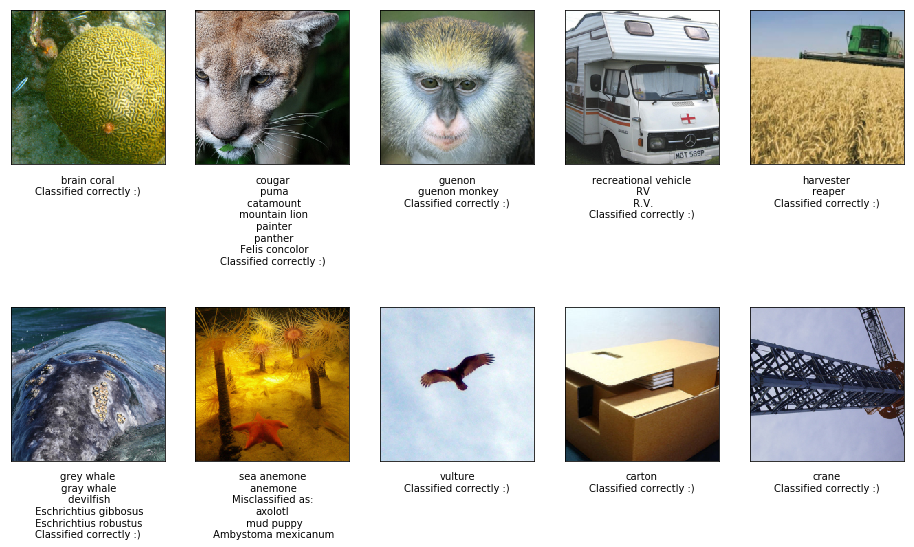

In [56]:
figsize(16, 10)
for i in range(10):
    img = ilsvrc.data[10 + i]
    label = ilsvrc.labels[10 + i]

    img_torch = to_variable(img, volatile=True)
    predicted_label_id = to_np(vgg.predict(img_torch))[0]
    predicted_label = ilsvrc.id_to_label[predicted_label_id]
    
    desc = ilsvrc.label_to_desc[label].split(',')
    if label == predicted_label:
        desc.append('Classified correctly :)')
    else:
        desc.append('Misclassified as:')
        desc.extend(ilsvrc.label_to_desc[predicted_label].split(','))
    
    ax = subplot(2, 5, 1 + i)
    ax.set_xlabel('\n'.join(desc)) #, {'verticalalignment': 'bottom'})
    ax.set_xticklabels([], visible=False)
    ax.set_yticklabels([], visible=False)
    ax.tick_params(axis='both', which='both', bottom='off', left='off', top='off')
    imshow(img)

## Implement classification of your own images below [1p]



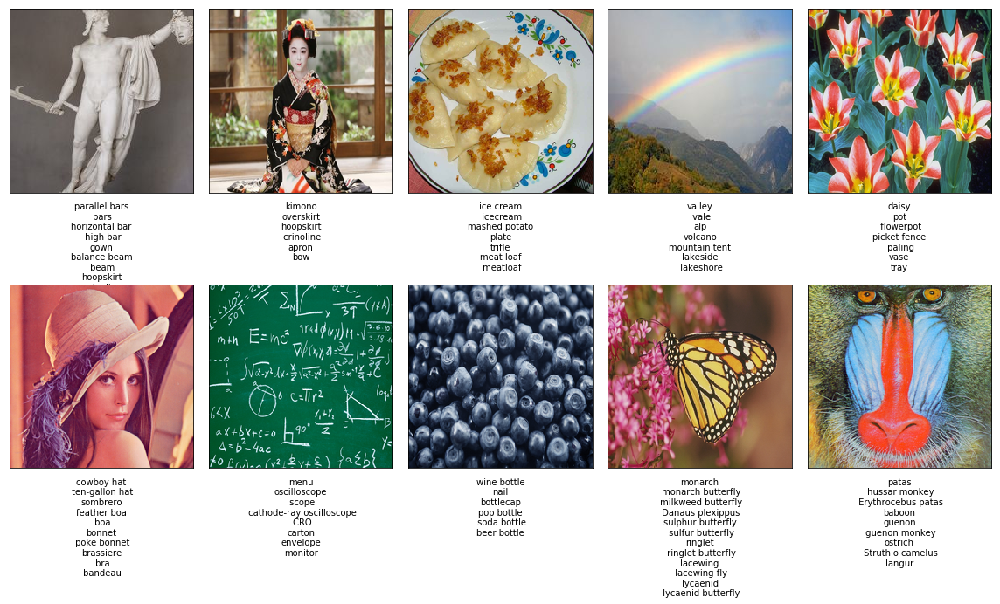

In [57]:
pictures = os.listdir("pictures")
num_picts = len(pictures)

figsize(16, len(pictures))
for i, pname in enumerate(pictures):
    img = ilsvrc.load_image(os.path.join("pictures", pname))
    
    img_torch = to_variable(img, volatile=True)
    predicted_label_ids = to_np(vgg.predict_topk(img_torch.float()))[0]
    predicted_label = ilsvrc.id_to_label[predicted_label_ids[0]]
    desc = []
    for p in predicted_label_ids:
        predicted_label = ilsvrc.id_to_label[p]
        desc.extend(ilsvrc.label_to_desc[predicted_label].split(','))
    
    ax = subplot(2, 5, 1 + i)
    ax.set_xlabel('\n'.join(desc)) #, {'verticalalignment': 'bottom'})
    ax.set_xticklabels([], visible=False)
    ax.set_yticklabels([], visible=False)
    ax.tick_params(axis='both', which='both', bottom='off', left='off', top='off')
    imshow(img)
plt.tight_layout()

## Analyse the responses of the network when part of the input is obscured

In [58]:
from itertools import islice 

def obscured_img(img, boxsize=8, stride=4):
    w, h, d = img.shape

    def next_ij(i, j):
        j += stride
        if j > h:
            i += stride
            j = boxsize
        return i, j
        
    if boxsize > w or boxsize > h:
        raise RuntimeError("boxsize too large")
        
    i, j = boxsize, boxsize
    while i <= w :
        res = np.copy(img)
        res[i-boxsize:i, j-boxsize:j, :] = 0.5 # tu ma być 0.5 czy 0?
        i, j = next_ij(i, j)
        yield res
    
# Generator of minibatches which have partial obstructions
def obscured_imgs(img, boxsize=8, bsz=64, stride=4):
    one_img_gen = obscured_img(img, boxsize, stride)
    while True:
        res = list(islice(one_img_gen, bsz))
        if len(res) == 0:
            raise StopIteration
        yield res
    


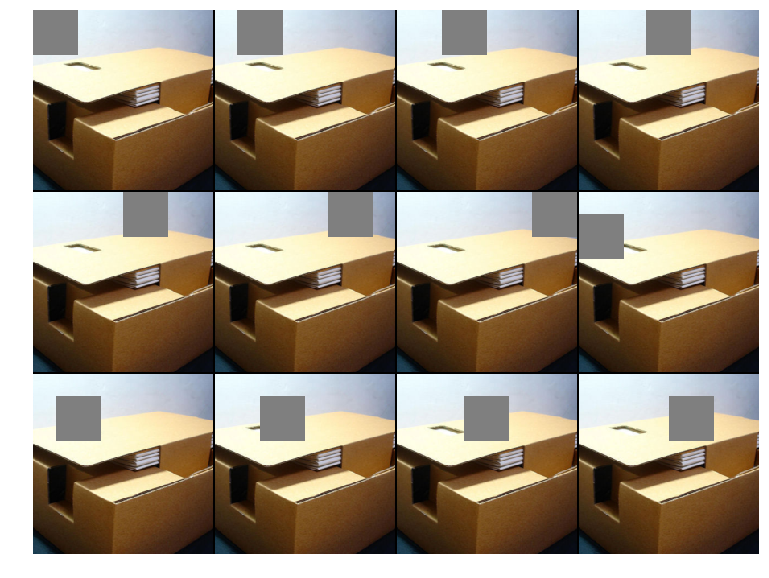

In [59]:
# Reminder: "common" is a local package (set-env.sh adds it to $PYTHONPATH)
import common.plotting

# Show samples from an obscured batch
sqrt_gen = obscured_imgs(ilsvrc.data[18], boxsize=56, bsz=12, stride=28)
batch = sqrt_gen.next()
batch = np.vstack([im[None] for im in batch])

common.plotting.plot_mat(batch.transpose(0, 3, 1, 2))

In [60]:
#img_torch = to_variable(ilsvrc.data[32], volatile=True)
#vgg.probabilities(img_torch).max()

In [91]:
base = plt.cm.get_cmap(None)
base

In [98]:
N = 1
base_cmap = 'cubehelix'
base = plt.cm.get_cmap(base_cmap)
color_list = base(np.linspace(0, 1, N))
cmap_name = base.name + str(N)
res = base.from_list(cmap_name, color_list, N)


1

In [61]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

In [115]:
def layer_information(img_idx, boxsize= 52, bsz=64, stride = 14):
    idx = img_idx
    img = ilsvrc.data[idx]
    label = ilsvrc.labels[idx] 

    # if you run out of GPU mem split batch into smaller ones

    vgg.eval()

    # Accumulate activations for activation heatmap,
    # true class probability map, network prediction map
    map_types = ['heat', 'prob', 'pred']
    maps = {mt: [] for mt in map_types}
    for  batch in obscured_imgs(img, boxsize, bsz, stride):
        # choose a layer and a neuron. Aggregate its activations across all locations in the image
        # The sample code used layer conv2_1 an dneuron #1        
        batch_torch = to_variable(np.array(batch), volatile=True)
        maps['heat'].append(to_np(vgg.layer_activations(batch_torch, "conv2_1"))[:, 1].sum(axis=(1, 2)))
        
        # record the probability assigned to the correct class
        maps['prob'].append(to_np(vgg.probabilities(batch_torch ))[:, ilsvrc.label_to_id[label]])
        # record the network predictions
        maps['pred'].append(to_np(vgg.predict(batch_torch ) ))
      

    for k in maps:
        maps[k] = np.concatenate(maps[k])
        maps[k] = maps[k].reshape(int(np.sqrt(maps[k].shape[0])), -1)
        
    ##------------ print results
    
    #
    # This image recreates figure 7 from M. Zieler et al.
    # Visualizing and Understanding Convolutional Neural Networks
    # https://arxiv.org/pdf/1311.2901.pdf
    #

    figure(figsize(16, 10))
    subplot(2, 2, 1)
    imshow(img)
    title('Original Image')

    subplot(2, 2, 2)
    imshow(maps['heat'])
    colorbar()
    title('Magnitude of activations in a selected layer\n'
          'As a function of the obscuring square location')

    subplot(2, 2, 3)
    imshow(maps['prob'])
    colorbar()
    title('Probability of the correct class as a function\n'
          'of the obscuring square location.')

    subplot(2, 2, 4)
    discrete = np.zeros_like(maps['pred'], dtype=np.int64) #((maps['pred'].shape[0]), dtype=np.int32)
    values = np.unique(maps['pred']).astype(np.int64)
    for i, v in enumerate(values):
        discrete[np.where(maps['pred'] == v)] = i
    num_values = max(values.shape[0], 1)
    if num_values > 1:
        imshow(discrete, cmap=discrete_cmap(num_values, 'cubehelix'))
        cb = colorbar(ticks=np.arange((num_values-1.0)/num_values/2.0, num_values,
                                 (num_values-1.0)/num_values))
        cb.set_ticklabels([ilsvrc.id_to_desc[v] for v in values])
    else:
        imshow(discrete)
    title('The most probable class as a function\n'
          'of the obscuring square location')


    tight_layout()

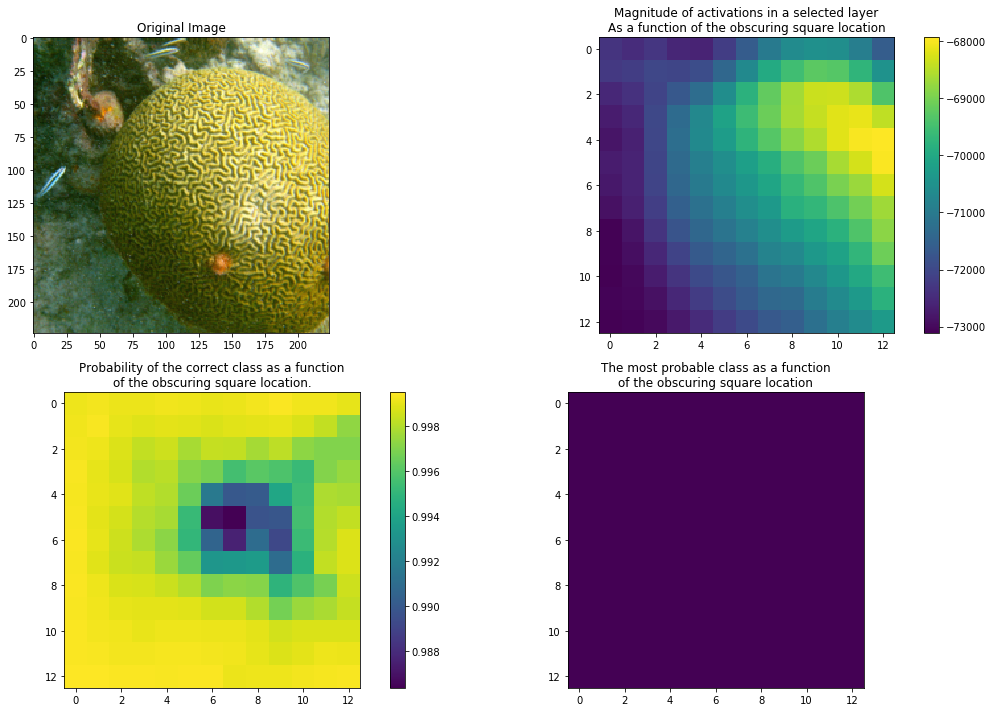

In [116]:
layer_information(10)

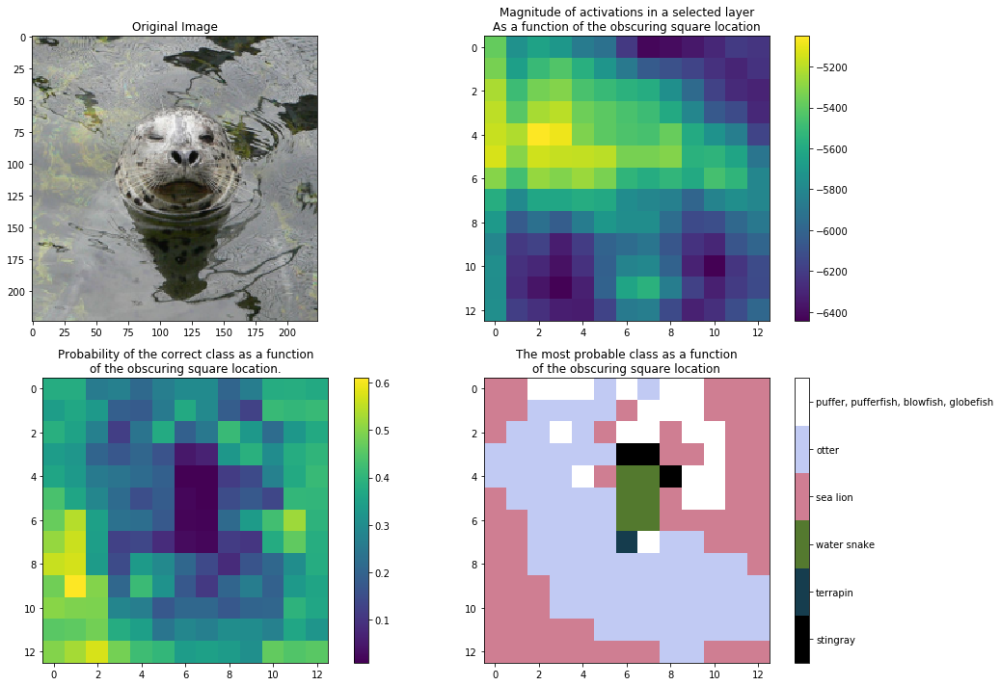

In [69]:
layer_information(32)

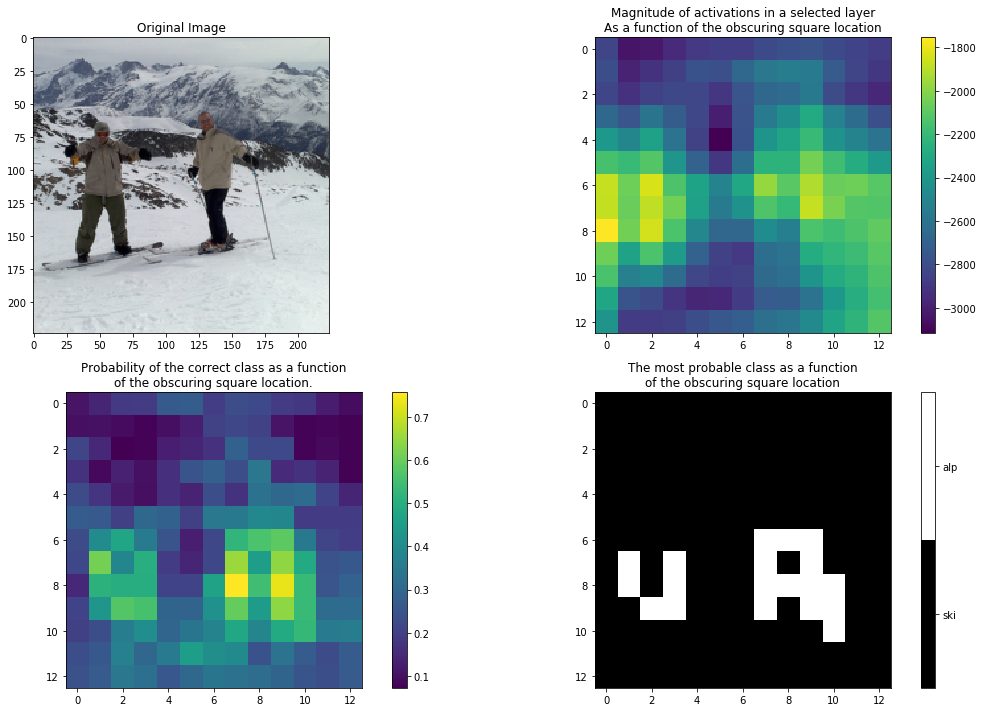

In [117]:
layer_information(1)

## Implement the method of [Integrated Gradients](https://arxiv.org/abs/1703.01365)

A baseline method for computing the importance of a pixel is compute the gradient of the output assiciated with the correct class with respect to the pixels. However, better results can be obtained when a series of gradients is computed, on images that range from an non-informative one (all gray), to the target image.

Compute the gradients with respect the newtork's inputs for 50-300 images that linearly interpolate between an all-gray image and the target image. Then compute the magnitute of the gradients for the three channel of each pixel, and add all the magnitudes. Plot the resulting pixel saliencies and overlay them with the image, as shown in the example.

how do I use **batch** in computing gradients?

In [124]:
def integrated_gradients(img_idx, num_integration_points=64, batch_size = 64):
    idx = img_idx
    img = ilsvrc.data[idx][None, ...]
    label = ilsvrc.labels[idx] 

    predicted_id = to_np(vgg.predict(to_variable(img, volatile=True)))[0]

    print ("Predicted: %s (correct: %s)" % (ilsvrc.id_to_desc[predicted_id],
                                            ilsvrc.label_to_desc[label]))

    assert (num_integration_points % batch_size) == 0

    weights = np.linspace(0.0, 1.0, num_integration_points).astype('float32')[:, None, None, None]
    grads = []
    for i in range(0, num_integration_points, batch_size):
        batch = img * weights[i:i+batch_size]
        batch = to_variable(batch, requires_grad=True)
        prediction = vgg.probabilities(batch )[:, ilsvrc.label_to_id[label]].sum()
        prediction.backward()
        #zsumować pstwa i dopiero backpropagation
        #for p in prediction:
            #p.backward()
        grads.append(to_np(batch.grad))
        
    grads = np.concatenate(grads, axis=0)
    importance_scores = np.sum(np.sum(np.abs(grads), axis=0), axis=-1)
    
    # print results ---------------------
    figsize(16, 10)
    subplot(1,3,1)
    imshow(importance_scores)
    colorbar(shrink=0.4)
    title('Computed importance of pixels')

    subplot(1,3,2)
    #normalize the scores to be <=1
    w = importance_scores / importance_scores.max()
    w = w ** 0.7 # a little gamma correction may make the image prettier
    plt.imshow(img[0] * w[:,:,None])
    title('Image weighted by the importance')

    subplot(1,3,3)
    plt.imshow(img[0])
    title('Original image')


Predicted: ski (correct: alp)


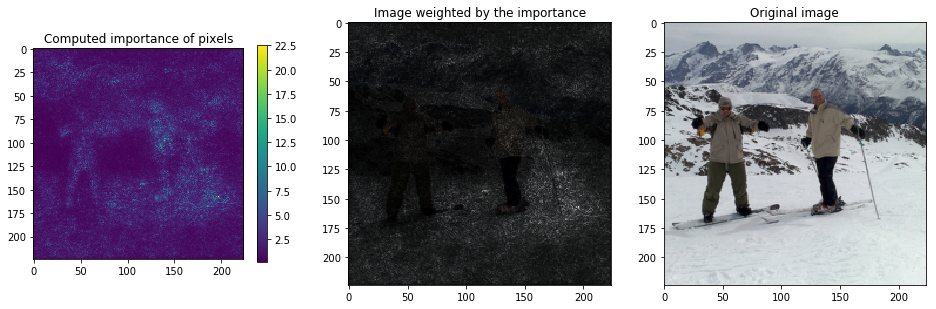

In [125]:
integrated_gradients(1)

Predicted: Shetland sheepdog, Shetland sheep dog, Shetland (correct: Shetland sheepdog, Shetland sheep dog, Shetland)


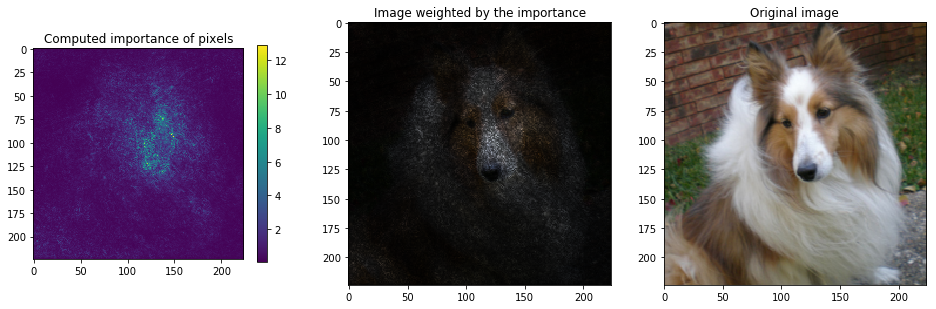

In [126]:
integrated_gradients(2)

Predicted: sea snake (correct: garter snake, grass snake)


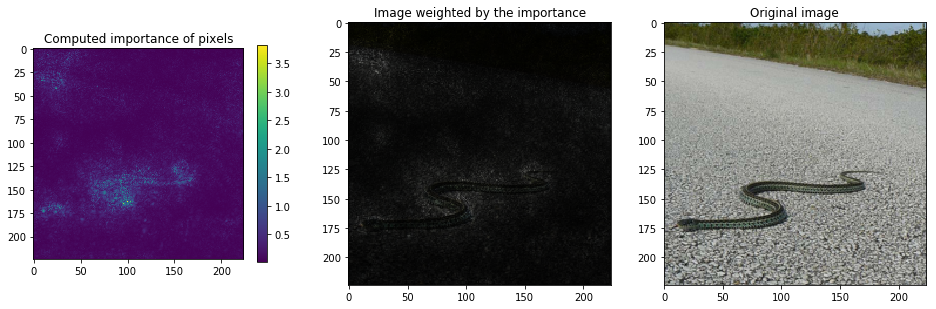

In [127]:
integrated_gradients(5)

Predicted: cabbage butterfly (correct: cabbage butterfly)


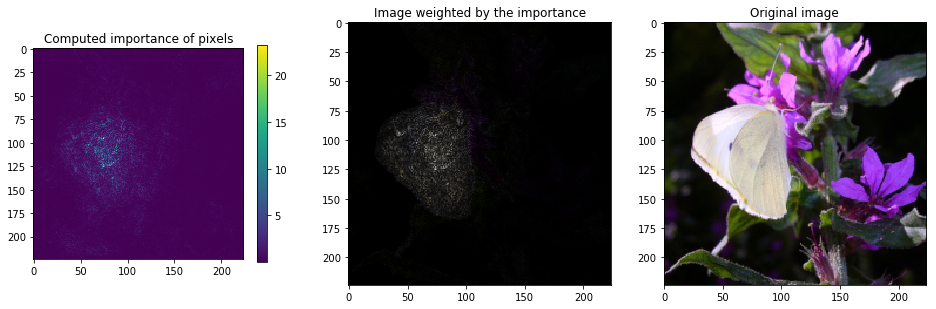

In [128]:
integrated_gradients(30)

In [32]:
m = nn.Linear(20, 30)
input = Variable(torch.randn(128, 20))
output = m(input)
m.weight

Parameter containing:

Columns 0 to 9 
 0.2234  0.1840  0.2027  0.1925 -0.0901  0.0408 -0.1873  0.1387  0.0966  0.0272
-0.1767  0.1354 -0.1997 -0.1301  0.0331 -0.1093 -0.0557  0.0706 -0.0944  0.1561
 0.2073 -0.0561  0.0970 -0.1858 -0.1826  0.0333 -0.1710 -0.0348 -0.1372  0.1354
-0.0497 -0.0974 -0.1758  0.0013  0.1996  0.1744  0.1362 -0.0119  0.1745 -0.0350
 0.1790  0.1771  0.0809 -0.0864  0.1907  0.0948 -0.2044 -0.1608 -0.1143  0.1676
-0.0267  0.0103 -0.1334 -0.0651  0.0097  0.1602  0.2151 -0.0492  0.0895  0.2183
 0.1050 -0.1814  0.0907 -0.1117  0.1326  0.1795  0.2150 -0.0283  0.1462  0.2022
 0.1011  0.0934 -0.0291 -0.0796  0.0291  0.0844 -0.1769 -0.0210 -0.1283  0.2184
 0.1662 -0.1568  0.0231 -0.1978 -0.0029 -0.0176  0.1774 -0.0399 -0.0597  0.2146
-0.1339  0.0313 -0.2176 -0.0957  0.1319 -0.0278 -0.0446 -0.1901  0.0731 -0.2189
 0.1496  0.1857  0.0069  0.1860  0.1809  0.1066  0.0579 -0.0011 -0.0003 -0.1990
-0.0956  0.0898  0.0972  0.1133  0.0052  0.1509 -0.1809 -0.0355  0.2167 -0.0978
-

# Problem 2: Reusing a VGG Network [3p]

Training large-scale models takes much time and resources. It also requires caution when picking hyperparameters. It is a common practice to share learned parameters of large models, and reuse them in different tasks. Weight matrices can be shared, even between entirely different frameworks. Further reading: [How transferable are features in deep neural networks?](https://arxiv.org/abs/1411.1792) by Yosinski et al.

Neural networks trained for image classification might be seen as composed of two elements: a feature extractor, and a classifier. The former is typically made of a stack of convolutional layers, while the latter is the last linear layer of the model.

We will focus on the deepest models - VGG16 and/or VGG19. To complete the task, load pre-trained VGG model. Then:
1. **[2p]** Train the classifier part of the network on the
  [Caltech101](http://www.vision.caltech.edu/Image_Datasets/Caltech101/) dataset of images:
  * replace the classifier with a new randomly initialized one, whose output dimensionality matches
    the number of classes of the Caltech101 dataset. You can replace all layers in the classifier
    part of the VGG with just one affine projection into 102 classes.
  * to significantly reduce training time and avoid destroying network weights early in the training,
    train only the weights of the classifier. You can achieve this by applying the optimization only
    to the classifier's parameters.
    
2. **[1p]** Repeat the training with and without data augmentation - change the provided data loaders. 
  How does it influence training?
  
This procedure should quickly give you less than 10% training errors on the Caltech101 dataset!

In [131]:
CUDA = True

In [132]:
# Get a fresh VGG network

vgg = VGG('vgg19')
if CUDA:
    vgg.cuda()

In [133]:
# List layers in the model
print 'Feature layers'
print '--------------'
for name, layer in zip(vgg.feature_names, vgg.features):
    print '{1: <12} {0: <8}  ({2}'.format(name, *str(layer).split('(', 1))
print '\nClassifier layers'
print '-----------------'
for layer in vgg.classifier:
    print '{: <12}({}'.format(*str(layer).split('(', 1))

Feature layers
--------------
Conv2d       conv1_1   (3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_1   (inplace)
Conv2d       conv1_2   (64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_2   (inplace)
MaxPool2d    pool1     (size=(2, 2), stride=(2, 2), dilation=(1, 1))
Conv2d       conv2_1   (64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_1   (inplace)
Conv2d       conv2_2   (128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_2   (inplace)
MaxPool2d    pool2     (size=(2, 2), stride=(2, 2), dilation=(1, 1))
Conv2d       conv3_1   (128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_1   (inplace)
Conv2d       conv3_2   (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_2   (inplace)
Conv2d       conv3_3   (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_3   (inplace)
Conv2d      

In [134]:
class SubsampledImageDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, indexes, transform, **kwargs):
        super(SubsampledImageDataset, self).__init__(**kwargs)
        self.dataset = dataset
        self.indexes = indexes
        self.transform = transform
    
    def __getitem__(self, i):
        img, label = self.dataset[self.indexes[i]]
        img = self.transform(img)
        return img, label
    
    def __len__(self):
        return len(self.indexes)

In [135]:
caltech_whole_dataset = torchvision.datasets.ImageFolder('/pio/data/data/Caltech101/101_ObjectCategories/')

all_indexes = np.random.permutation(len(caltech_whole_dataset))
train_size = int(len(all_indexes) * 0.8)

caltech_train_dataset = SubsampledImageDataset(
    caltech_whole_dataset,
    all_indexes[:train_size],
    torchvision.transforms.Compose([
        torchvision.transforms.RandomSizedCrop(224),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.ToTensor(),
    ]))

caltech_test_dataset = SubsampledImageDataset(
    caltech_whole_dataset,
    all_indexes[train_size:],
    torchvision.transforms.Compose([
        torchvision.transforms.Scale(256),
        torchvision.transforms.CenterCrop(224),
        torchvision.transforms.ToTensor(),
    ]))

caltech_datasets = {
    'train': caltech_train_dataset,
    'test': caltech_test_dataset,
}

In [137]:
batch_size = 64

caltech_loaders = {
    'train': torch.utils.data.DataLoader(
        caltech_datasets['train'], batch_size=batch_size,
        num_workers=4,
        shuffle=True),
    'test': torch.utils.data.DataLoader(
        caltech_datasets['test'], batch_size=batch_size,
        num_workers=4,
        shuffle=False)}

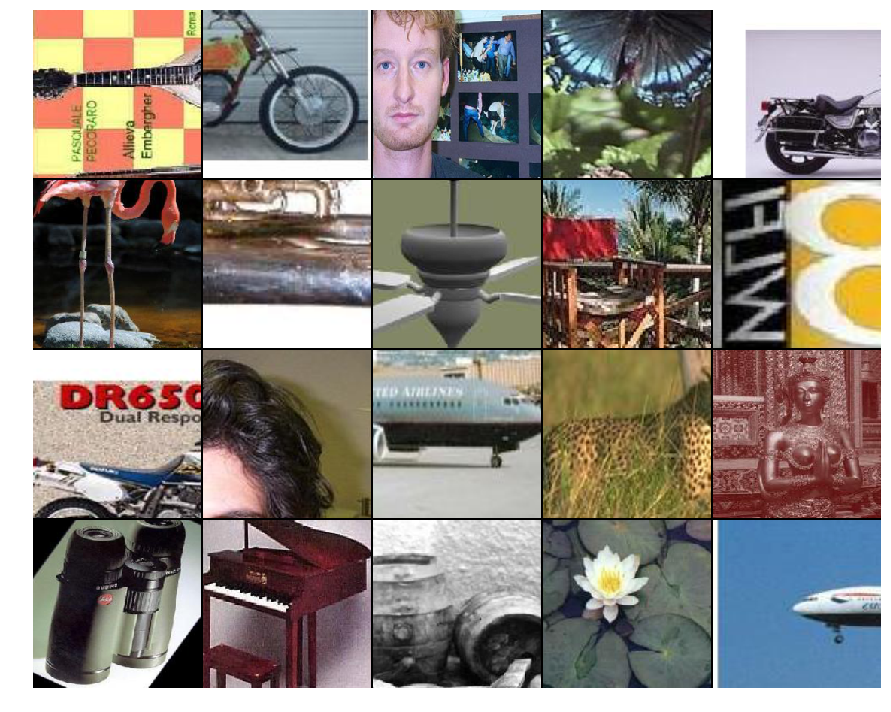

In [138]:
train_batch = next(iter(caltech_loaders['train']))
common.plotting.plot_mat(to_np(train_batch[0])[:20])
plt.tight_layout()

In [139]:
print '\nClassifier layers'
print '-----------------'
for layer in vgg.classifier:
    print '{: <12}({}'.format(*str(layer).split('(', 1))


Classifier layers
-----------------
Linear      (25088 -> 4096)
ReLU        (inplace)
Dropout     (p = 0.5)
Linear      (4096 -> 4096)
ReLU        (inplace)
Dropout     (p = 0.5)
Linear      (4096 -> 1000)


In [140]:
# Training code is based on assignment 4
def compute_error_rate(model, data_loader, cuda=True):
    model.eval()
    num_errs = 0.0
    num_examples = 0
    for x, y in data_loader:
        if cuda:
            x = x.cuda()
            y = y.cuda()
        x = Variable(x, volatile=True)
        y = Variable(y, volatile=True)
        outputs = model.forward(x)
        _, predictions = outputs.data.max(dim=1)
        num_errs += (predictions != y.data).sum()
        num_examples += x.size(0)
    return 100.0 * num_errs / num_examples

        
def train(model, data_loaders, optimizer, num_epochs=1,
          log_every=100, cuda=True):
    if cuda:
        model.cuda()
    iter_ = 0
    epoch = 0
    best_params = None
    best_val_err = np.inf
    history = {'train_losses': [], 'train_errs': [], 'val_errs': []}
    print('Training the model!')
    print('You can interrupt it at any time.')
    try:
        while epoch < num_epochs:
            model.train()
            epoch += 1
            for x, y in data_loaders['train']:
                if cuda:
                    x = x.cuda()
                    y = y.cuda()
                iter_ += 1
                # x = Variable(x.view(x.size(0), -1), requires_grad=False)
                x = Variable(x, requires_grad=False)
                y = Variable(y, requires_grad=False)
                
                optimizer.zero_grad()
                out = model.forward(x)
                loss = criterion(out, y)
                loss.backward()
                optimizer.step()
                _, predictions = out.data.max(dim=1)
                err_rate = 100.0 * (predictions != y.data).sum() / out.size(0)

                history['train_losses'].append(loss.data[0])
                history['train_errs'].append(err_rate)

                if iter_ % log_every == 0:
                    print "Minibatch {0: >6}  | loss {1: >5.2f} | err rate {2: >5.2f}%" \
                          .format(iter_, loss.data[0], err_rate)

            val_err_rate = compute_error_rate(model, data_loaders['test'], cuda)
            history['val_errs'].append((iter_, val_err_rate))

            if val_err_rate < best_val_err:
                best_epoch = epoch
                best_val_err = val_err_rate
            m = "After epoch {0: >2} | valid err rate: {1: >5.2f}% | doing {2: >3} epochs" \
                .format(epoch, val_err_rate, num_epochs)
            print '{0}\n{1}\n{0}'.format('-' * len(m), m)
    except KeyboardInterrupt:
        pass
    if best_params is not None:
        print "\nLoading best params on validation set (epoch %d)\n" %(best_epoch)
        model.parameters = best_params
    plot_history(history)

def plot_history(history):
    figsize(16, 4)
    subplot(1,2,1)
    train_loss = np.array(history['train_losses'])
    semilogy(np.arange(train_loss.shape[0]), train_loss, label='batch train loss')
    legend()
        
    subplot(1,2,2)
    train_errs = np.array(history['train_errs'])
    plot(np.arange(train_errs.shape[0]), train_errs, label='batch train error rate')
    val_errs = np.array(history['val_errs'])
    plot(val_errs[:,0], val_errs[:,1], label='validation error rate', color='r')
    ylim(0,20)
    legend()        

Training the model!
You can interrupt it at any time.
Minibatch     50  | loss  2.60 | err rate 56.25%
Minibatch    100  | loss  1.79 | err rate 42.19%
----------------------------------------------------------
After epoch  1 | valid err rate: 23.18% | doing  10 epochs
----------------------------------------------------------
Minibatch    150  | loss  1.01 | err rate 29.69%
Minibatch    200  | loss  1.06 | err rate 23.44%
----------------------------------------------------------
After epoch  2 | valid err rate: 16.35% | doing  10 epochs
----------------------------------------------------------
Minibatch    250  | loss  0.92 | err rate 26.56%
Minibatch    300  | loss  1.20 | err rate 34.38%
----------------------------------------------------------
After epoch  3 | valid err rate: 15.58% | doing  10 epochs
----------------------------------------------------------
Minibatch    350  | loss  1.00 | err rate 23.44%
Minibatch    400  | loss  0.73 | err rate 21.88%
Minibatch    450  | los

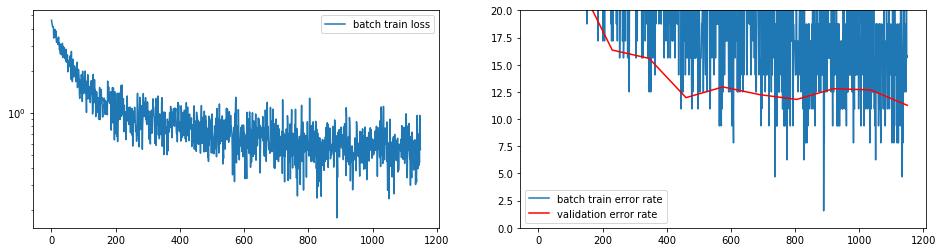

In [142]:
# TODO 
# implement a new classifier using `torch.nn.Sequential` and `torch.nn.Linear`
classifier = torch.nn.Sequential(
    torch.nn.Linear(25088, 4096),
    torch.nn.ReLU(inplace=True),
    torch.nn.Dropout(p= 0.5),
    torch.nn.Linear(4096, 4096),
    torch.nn.ReLU(inplace=True),
    torch.nn.Dropout(p=0.5),
    torch.nn.Linear(4096, 102))

# Replace the classifier of our VGG network
vgg.classifier = classifier

# Disable gradient computation for the all parameter.
# It will speed up the backward pass - the gradient will not be
# backpropagated through the feature extractor.
for p in vgg.parameters():
    p.requires_grad = False

# Reenable gradient computation in our new classifier
for p in vgg.classifier.parameters():
    p.requires_grad = True

#criterion = nn.NLLLoss()
criterion = nn.CrossEntropyLoss()

# Train only the params of the classifier
optimizer = torch.optim.Adam(
    vgg.classifier.parameters(), lr=0.0001)

train(vgg, caltech_loaders, optimizer,
      num_epochs=10, log_every=50, cuda=CUDA)

In [143]:

def add_noise(img):
    img_numpy = img.numpy()
    mi = img_numpy.ravel().mean()
    sigma = img_numpy.ravel().std()
    noise = np.random.normal(mi/2, sigma/4, size=img_numpy.shape)
    img_numpy += noise
    return torch.from_numpy(img_numpy)

def shift_right(res, img, offset):
    res[0][offset:, :] = img[0][:-offset,:]
    return res
def shift_left(res, img, offset):
    res[0][:-offset, :] = img[0][offset:, :]
    return res
def shift_up(res, img, offset):
    res[0][:, offset:] = img[0][:,:-offset]
    return res
def shift_down(res, img, offset):
    res[0][:,:-offset] = img[0][:, offset:]
    return res


def shift_randomly(img):
    funcs = [shift_right, shift_left, shift_up, shift_down]
    img_numpy = img.numpy()
    res = np.zeros_like(img_numpy)
    f = funcs[np.random.randint(4)]
    res = f(res, img_numpy, 3)
    return torch.from_numpy(res)


In [144]:
caltech_whole_dataset = torchvision.datasets.ImageFolder('/pio/data/data/Caltech101/101_ObjectCategories/')

all_indexes = np.random.permutation(len(caltech_whole_dataset))
train_size = int(len(all_indexes) * 0.8)

caltech_train_dataset = SubsampledImageDataset(
    caltech_whole_dataset,
    all_indexes[:train_size],
    torchvision.transforms.Compose([
        torchvision.transforms.RandomSizedCrop(224),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.ToTensor(),
    ]))

caltech_train_dataset_noise = SubsampledImageDataset(
    caltech_whole_dataset,
    all_indexes[:train_size],
    torchvision.transforms.Compose(
    [torchvision.transforms.Scale(256),
     torchvision.transforms.CenterCrop(224),
     torchvision.transforms.ToTensor(),
     torchvision.transforms.Lambda(add_noise),
     torchvision.transforms.Lambda(shift_randomly)
    ]))


caltech_test_dataset = SubsampledImageDataset(
    caltech_whole_dataset,
    all_indexes[train_size:],
    torchvision.transforms.Compose([
        torchvision.transforms.Scale(256),
        torchvision.transforms.CenterCrop(224),
        torchvision.transforms.ToTensor(),
    ]))

caltech_datasets = {
    'train': torch.utils.data.ConcatDataset([caltech_train_dataset, caltech_train_dataset_noise]),
    'test': caltech_test_dataset,
}

In [146]:
batch_size = 64

caltech_loaders = {
    'train': torch.utils.data.DataLoader(
        caltech_datasets['train'], batch_size=batch_size,
        num_workers=4,
        shuffle=True),
    'test': torch.utils.data.DataLoader(
        caltech_datasets['test'], batch_size=batch_size,
        num_workers=4,
        shuffle=False)}

Training the model!
You can interrupt it at any time.
Minibatch     50  | loss  2.62 | err rate 56.25%
Minibatch    100  | loss  1.76 | err rate 42.19%
Minibatch    150  | loss  1.16 | err rate 28.12%
Minibatch    200  | loss  1.44 | err rate 37.50%
----------------------------------------------------------
After epoch  1 | valid err rate: 14.98% | doing  10 epochs
----------------------------------------------------------
Minibatch    250  | loss  0.99 | err rate 26.56%
Minibatch    300  | loss  1.01 | err rate 31.25%
Minibatch    350  | loss  0.60 | err rate 21.88%
Minibatch    400  | loss  1.28 | err rate 31.25%
Minibatch    450  | loss  0.77 | err rate 23.44%
----------------------------------------------------------
After epoch  2 | valid err rate: 10.77% | doing  10 epochs
----------------------------------------------------------
Minibatch    500  | loss  0.65 | err rate 17.19%
Minibatch    550  | loss  1.01 | err rate 28.12%
Minibatch    600  | loss  0.52 | err rate 14.06%
Mini

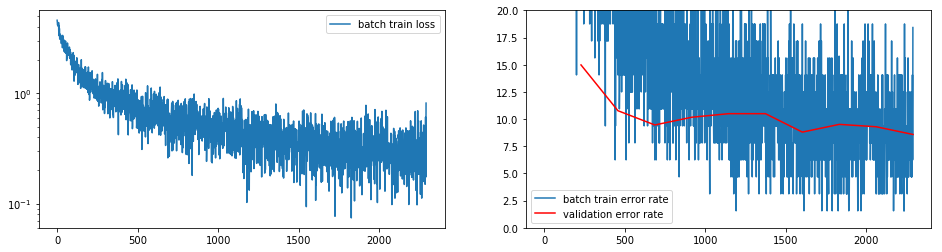

In [147]:
classifier = torch.nn.Sequential(
    torch.nn.Linear(25088, 4096),
    torch.nn.ReLU(inplace=True),
    torch.nn.Dropout(p= 0.5),
    torch.nn.Linear(4096, 4096),
    torch.nn.ReLU(inplace=True),
    torch.nn.Dropout(p=0.5),
    torch.nn.Linear(4096, 102))


# Replace the classifier of our VGG network
vgg.classifier = classifier

# Disable gradient computation for the all parameter.
# It will speed up the backward pass - the gradient will not be
# backpropagated through the feature extractor.
for p in vgg.parameters():
    p.requires_grad = False

# Reenable gradient computation in our new classifier
for p in vgg.classifier.parameters():
    p.requires_grad = True

#criterion = nn.NLLLoss()
criterion = nn.CrossEntropyLoss()

# Train only the params of the classifier
optimizer = torch.optim.Adam(
    vgg.classifier.parameters(), lr=0.0001)

train(vgg, caltech_loaders, optimizer,
      num_epochs=10, log_every=50, cuda=CUDA)

# Problem 3: A Neural Algorithm of Style [3p]

In 2015, Gatys et al. published [A Neural Algorithm of Style](https://arxiv.org/abs/1508.06576),
in which they demonstrates how to
generate images which preserve content of one one source image,
and the style of the other one. This allows to "transfer style",
e.g., from famous paintings to pictures taken with a digital camera.

Style transfer uses a pre-trained image recognition model.
Input image, initialized to random noise, is optimized in such a way,
so that patterns of activations in certain layers would match both
those of style and content. Weights of the network remain frozen,
as only the input image is being changed (through backpropagation).

Using pre-trained a VGG model, implement the artistic algotihm of style.
Begin by adding to the `VGG` class a function 

  `multi_layer_activations(x, layer_names)` .

It should take a list of layer names and input `x` as input, and return activations in those layers. Make sure   the function does it during a single forward pass.

Then:
* **[2p]** complete the code for style transfer and generate new, interesting images,
* **[1p]** by ommiting content loss generate textures based on input style paintings.

In [7]:
img_dir = os.path.join(os.environ['PYTORCH_DATA_PATH'], 'images')

In [8]:
!ls $img_dir

brad_pitt.jpg	      picasso_selfport1907.jpg	starry_night.jpg
escher_sphere.jpg     seated-nude.jpg		the_scream.jpg
frida_kahlo.jpg       shipwreck.jpg		tubingen.jpg
golden_gate.jpg       starry_night_crop.png	woman-with-hat-matisse.jpg
hoovertowernight.jpg  starry_night_google.jpg


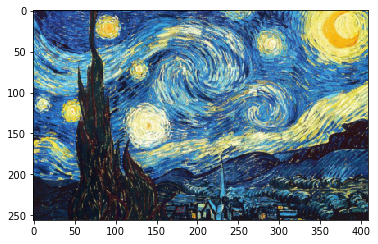

In [9]:
def load_image(path, size=256):
        img = PIL.Image.open(path)
        img = img.convert('RGB')
        img = torchvision.transforms.Scale(size)(img)
        return numpy.asarray(img).astype('float32') / 255.0

imshow(load_image(img_dir + '/starry_night.jpg'))

In [24]:
class StyleTransferNetNoContent(object):
    def __init__(self, style_layers, vgg_model='vgg19',style_weight=1):
        self.style_layers = style_layers
        self.style_captures = []
        self.style_weight = style_weight
        self.vgg = VGG(vgg_model)
        self.vgg.eval()
        for p in self.vgg.parameters():
            p.requires_grad = False
        self.mse = nn.MSELoss()
        self.mse_no_avrg = nn.MSELoss(size_average=False)
        
        
    def capture_style(self, x):
        style_layers = self.vgg.multi_layer_activations(
            x, self.style_layers)
        self.style_captures = [self._gram_mat(l) for l in style_layers]

    def get_loss(self, x):
        style_values = self.vgg.multi_layer_activations(x, self.style_layers)
        self.style_losses = [0.25 * self.mse(self._gram_mat(G), S) 
                             for G, S in zip(style_values, self.style_captures)]
        loss = sum(self.style_losses) * self.style_weight
            
    def _gram_mat(self, x):
        """
        Compute the matrix of feature correlations.
        
        Input:
            x: tensor of size batch_size x num_channels x width x heigth
        
        Output:
            tensor of size batch_size x num_chanels x num_channels given by the formula
            
            out[b, c1, c2] = 1/width 1/heigth \sum_w=1^width \sum_h=1^heigth x[b, c1, w, h] * x[b, c2, w, h]
        """
        # Compute the Gram matrix, as defined in the docstring. 
        bsz, chs, _, _ = x.size()
        return torch.stack([ torch.mm(f, f.t()) for f in x.view(bsz, chs, -1)])
    

In [10]:
class StyleTransferNet(object):
    def __init__(self, style_layers, content_layers, vgg_model='vgg19',
                 content_weight=5e0, style_weight=1e2, omit_content = False):
        self.style_layers = style_layers
        self.style_captures = []
        self.style_weight = style_weight
        self.content_layers = content_layers
        self.content_captures = []
        self.content_weight = content_weight
        self.vgg = VGG(vgg_model)
        self.vgg.eval()
        for p in self.vgg.parameters():
            p.requires_grad = False
        self.mse = nn.MSELoss()
        self.mse_no_avrg = nn.MSELoss(size_average=False)
        self.omit_content = omit_content
        
    def capture_content(self, x):
        # implement saving naural activations for a chosen set of content layers
        self.content_captures = self.vgg.multi_layer_activations(x, self.content_layers)
        #print(self.content_captures[0].size())
        
    def capture_style(self, x):
        style_layers = self.vgg.multi_layer_activations(
            x, self.style_layers)
        self.style_captures = [self._gram_mat(l) for l in style_layers]

    def get_loss(self, x):
        if self.omit_content == False:
        
            needed_layers = self.content_layers + self.style_layers
            needed_values = self.vgg.multi_layer_activations(
                x, needed_layers)
            content_values = needed_values[:len(self.content_layers)]
            style_values = needed_values[len(self.content_layers):]

            self.content_losses = [0.5 * self.mse_no_avrg(F, P) for F, P in zip(content_values, self.content_captures)]   
            self.style_losses = [0.25 * self.mse(self._gram_mat(G), S) 
                                 for G, S in zip(style_values, self.style_captures)]

            # append onto the lists  self.content_losses and self.style_losses 
            # the L2 (euclidean) distances between the captured statistics and the 
            # reconstructed image's ones. Remember about applying the gram matrix to style!
            # You can use the self.mse to compute the L2 distance
            loss = sum(self.style_losses) * self.style_weight
            loss += sum(self.content_losses) * self.content_weight

            return loss
        
        else:
            style_values = self.vgg.multi_layer_activations(x, self.style_layers)
            self.style_losses = [0.25 * self.mse(self._gram_mat(G), S) 
                                 for G, S in zip(style_values, self.style_captures)]
            loss = sum(self.style_losses) * self.style_weight
            return loss
            
            
    def _gram_mat(self, x):
        """
        Compute the matrix of feature correlations.
        
        Input:
            x: tensor of size batch_size x num_channels x width x heigth
        
        Output:
            tensor of size batch_size x num_chanels x num_channels given by the formula
            
            out[b, c1, c2] = 1/width 1/heigth \sum_w=1^width \sum_h=1^heigth x[b, c1, w, h] * x[b, c2, w, h]
        """
        # Compute the Gram matrix, as defined in the docstring. 
        bsz, chs, _, _ = x.size()
        return torch.stack([ torch.mm(f, f.t()) for f in x.view(bsz, chs, -1)])
    

In [12]:
# TODO find a giid set of layers for the content and style images.
CUDA = True
model = StyleTransferNet(
    style_layers=[ 'conv1_1', 'conv2_1', 'conv3_1'],
    #style_layers=[ 'conv4_1'],
    content_layers=['conv4_2'], content_weight=10, style_weight=1e-2)

if CUDA:
    model.vgg.cuda()

RuntimeError: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1503966894950/work/torch/lib/THC/generic/THCStorage.cu:66

In [40]:
style_img_path = img_dir + '/starry_night.jpg'
content_img_path = img_dir + '/golden_gate.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

Capturing content
torch.Size([1, 512, 32, 42])
Capturing style


In [41]:
content_shape

(256, 341, 3)

In [42]:
# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

Iteration    186 | loss 295269.5625000


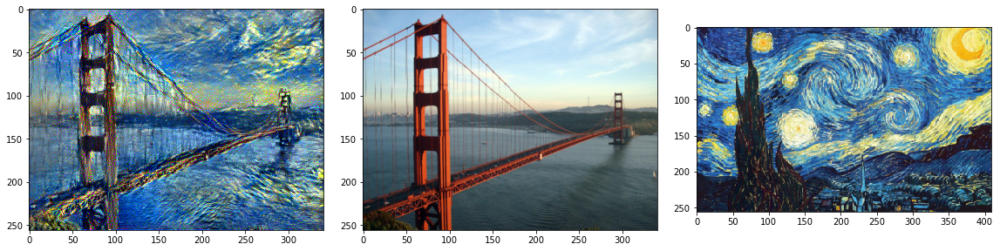

In [43]:
from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

In [11]:
# TODO find a giid set of layers for the content and style images.
CUDA = True
model = StyleTransferNet(
    style_layers=[ 'conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1'],
    #style_layers=[ 'conv4_1'],
    content_layers=['conv4_2'], content_weight=1e-1, style_weight=1e-2)

if CUDA:
    model.vgg.cuda()

In [12]:
style_img_path = img_dir + '/picasso_selfport1907.jpg'
content_img_path = img_dir + '/seated-nude.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

Capturing content
Capturing style


In [13]:
# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

Iteration     90 | loss 38261.3242188


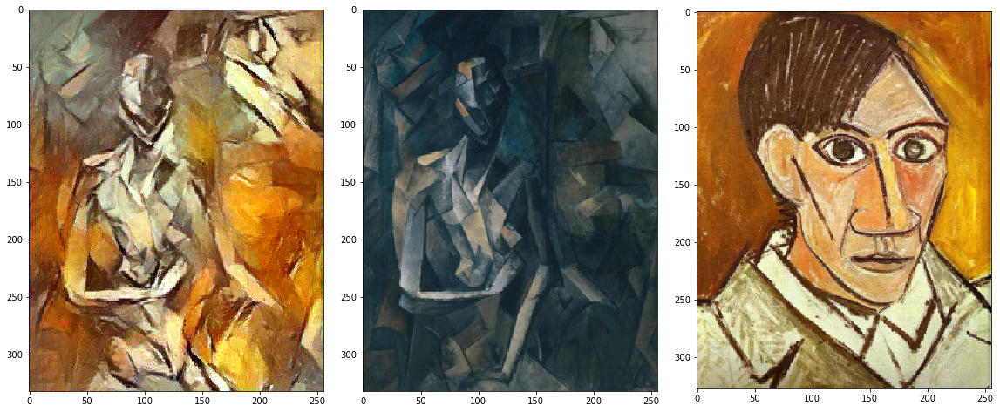

In [14]:
from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

Iteration     61 | loss 73270.1171875


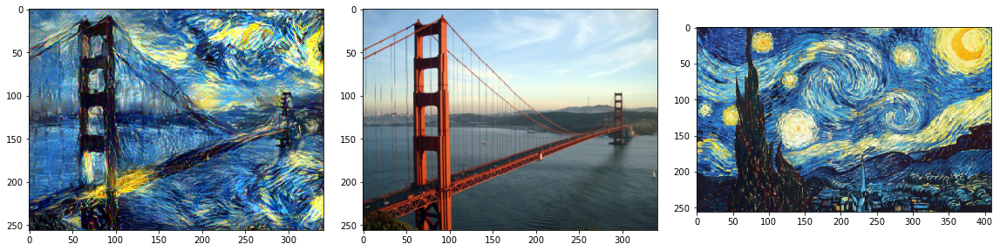

In [15]:
style_img_path = img_dir + '/starry_night.jpg'
content_img_path = img_dir + '/golden_gate.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

Iteration     65 | loss 57886.3945312


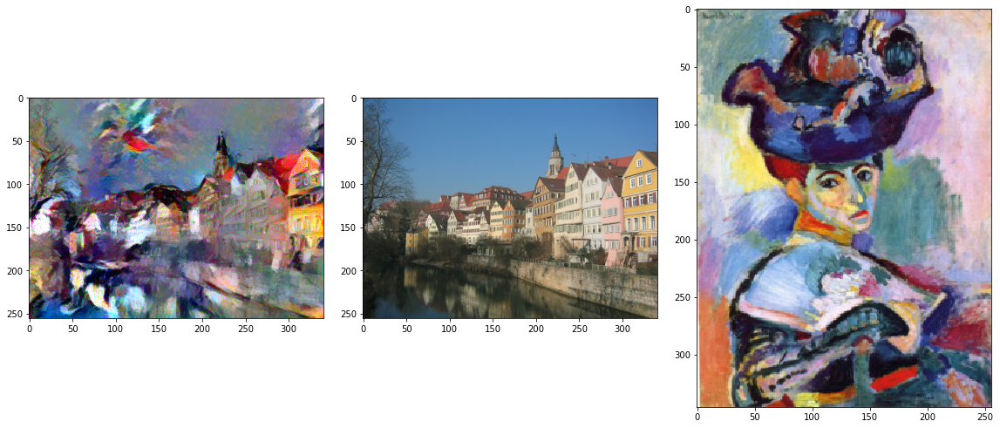

In [18]:
style_img_path = img_dir + '/woman-with-hat-matisse.jpg'
content_img_path = img_dir + '/tubingen.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

In [19]:
# TODO find a giid set of layers for the content and style images.
CUDA = True
model = StyleTransferNet(
    style_layers=[ 'conv1_1', 'conv2_1', 'conv3_1'],
    #style_layers=[ 'conv4_1'],
    content_layers=['conv4_2'], content_weight=10, style_weight=1e-3)


Iteration    103 | loss 74312.1328125


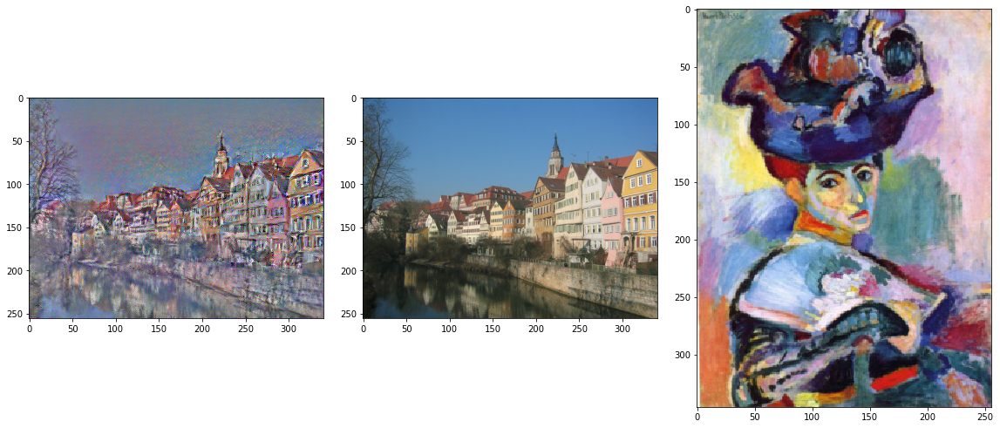

In [20]:
style_img_path = img_dir + '/woman-with-hat-matisse.jpg'
content_img_path = img_dir + '/tubingen.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
if CUDA:
    model.vgg.cuda()

In [53]:
# TODO find a giid set of layers for the content and style images.
CUDA = True
model = StyleTransferNet(
    style_layers=[ 'conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1'],
    #style_layers=[ 'conv4_1'],
    content_layers=['conv4_2'], content_weight=0, style_weight=1e-3)
if CUDA:
    model.vgg.cuda()

Iteration     45 | loss 88.5958786


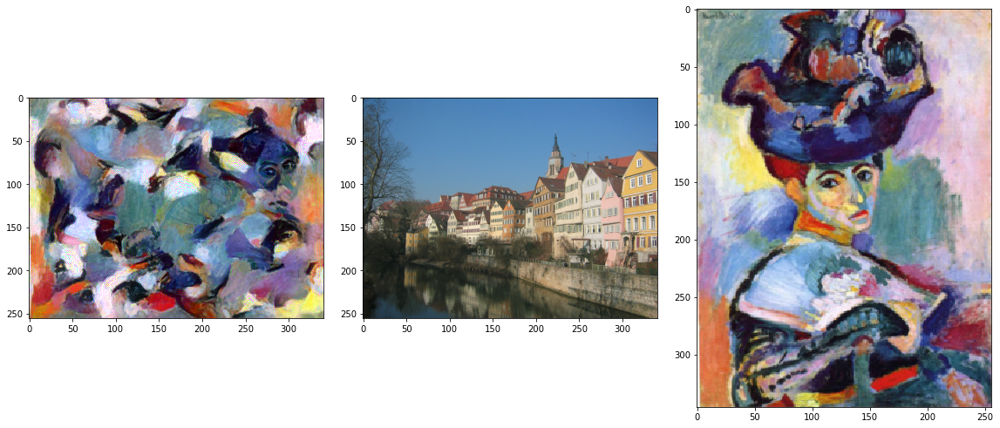

In [54]:
style_img_path = img_dir + '/woman-with-hat-matisse.jpg'
content_img_path = img_dir + '/tubingen.jpg'

style_img_size = 256
content_img_size = 256

style_image = load_image(style_img_path, style_img_size)
content_image = load_image(content_img_path, content_img_size)
content_shape = content_image.shape

print 'Capturing content'
model.capture_content(to_variable(content_image))

print 'Capturing style'
model.capture_style(to_variable(style_image))

# image = load_image(content_img_path, 512)
image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

#optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(132).imshow(content_image)
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.content_losses):
                print '  Content loss {}: {: >8.4f}'.format(i + 1, l.data[0] * model.content_weight)
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] * model.style_weight)
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

In [61]:
class StyleTransferNet(object):
    def __init__(self, style_layers, vgg_model='vgg19'):
        self.style_layers = style_layers
        self.style_captures = []
        
        self.vgg = VGG(vgg_model)
        self.vgg.eval()
        for p in self.vgg.parameters():
            p.requires_grad = False
        self.mse = nn.MSELoss()
        
    
    def capture_style(self, x):
        style_layers = self.vgg.multi_layer_activations(
            x, self.style_layers)
        self.style_captures = [self._gram_mat(l) for l in style_layers]

    def get_loss(self, x):        
        style_values = self.vgg.multi_layer_activations(x, self.style_layers)
        self.style_losses = [0.25 * self.mse(self._gram_mat(G), S) 
                             for G, S in zip(style_values, self.style_captures)]
        loss = sum(self.style_losses)
        return loss
            
            
    def _gram_mat(self, x):
        """
        Compute the matrix of feature correlations.
        
        Input:
            x: tensor of size batch_size x num_channels x width x heigth
        
        Output:
            tensor of size batch_size x num_chanels x num_channels given by the formula
            
            out[b, c1, c2] = 1/width 1/heigth \sum_w=1^width \sum_h=1^heigth x[b, c1, w, h] * x[b, c2, w, h]
        """
        # Compute the Gram matrix, as defined in the docstring. 
        bsz, chs, _, _ = x.size()
        return torch.stack([ torch.mm(f, f.t()) for f in x.view(bsz, chs, -1)])
    

In [64]:

CUDA = True
model = StyleTransferNetNoContent(
    style_layers=[ 'conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1'])
if CUDA:
    model.vgg.cuda()

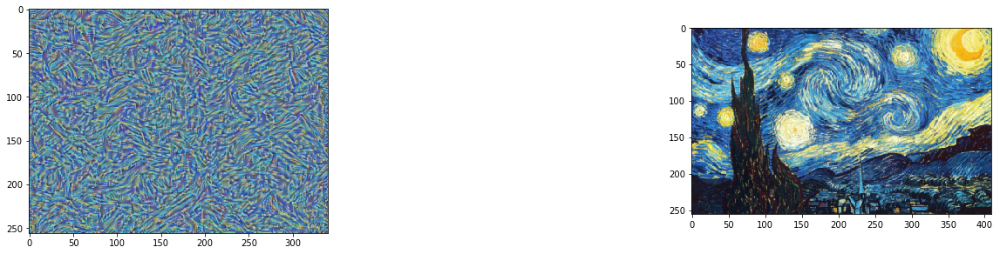

Iteration    495 | loss 30446308.0000000
  Style loss 1: 16274380.0000
  Style loss 2: 6963862.5000
  Style loss 3: 5652224.0000
  Style loss 4: 1538592.5000
  Style loss 5: 17249.7539


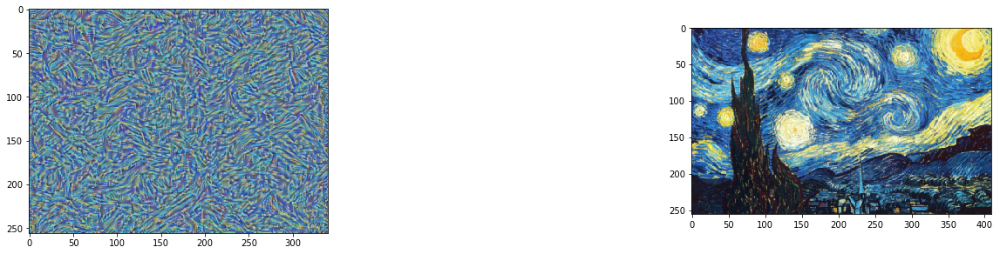

In [65]:
style_img_path = img_dir + '/starry_night.jpg'
style_img_size = 256
style_image = load_image(style_img_path, style_img_size)

print 'Capturing style'
model.capture_style(to_variable(style_image))

image = np.random.randn(256, 341, 3).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
#optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] )
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

Iteration    412 | loss 12852698.0000000


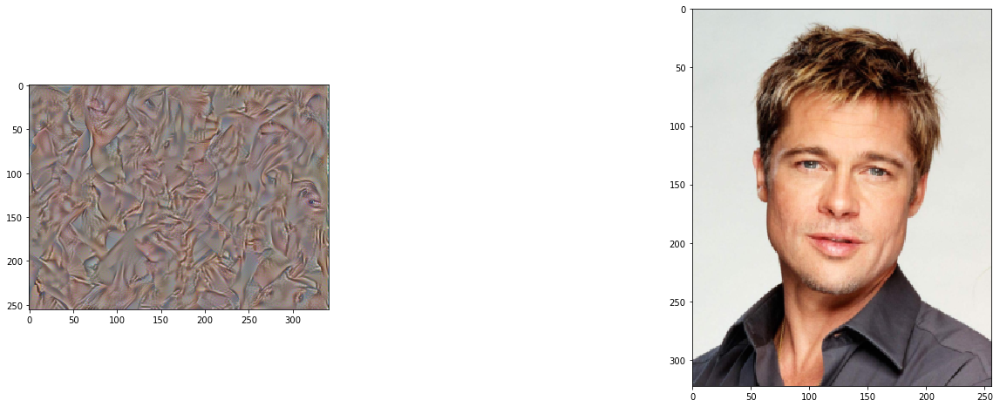

In [66]:
style_img_path = img_dir + '/brad_pitt.jpg'
style_img_size = 256
style_image = load_image(style_img_path, style_img_size)

print 'Capturing style'
model.capture_style(to_variable(style_image))

image = np.random.randn(256, 341, 3).astype(np.float32) * 0.01 + 0.5
image = to_variable(image, requires_grad=True)

# try using Adam or LBFGS

optimizer = torch.optim.Adam([image], lr=0.001)  #, momentum=0.5)
#optimizer = torch.optim.LBFGS([image])

from IPython import display

# Training loop
max_iters = 500
check_every = 5
old_loss = np.inf
tolerance = 0.00001
try:
    fig = figure(figsize=(16, 10))
    fig.add_subplot(133).imshow(style_image)
    ax = fig.add_subplot(131)
    
    tight_layout()
    imsh = ax.imshow(to_np(image));
    for iter_ in range(max_iters):
        
        def closure():
            optimizer.zero_grad()
            loss = model.get_loss(image)
            # print('loss:', loss.data.cpu().numpy()[0])
            loss.backward()
            return loss
        
        loss = optimizer.step(closure)
        image.grad.data.zero_()
            
        if iter_ % check_every == 0:
            display.clear_output(wait=True)
            imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
            #ax.imshow(np.clip(to_np(image), 0.0, 1.0))
            display.display(fig)
            
            
            print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])
            for i, l in enumerate(model.style_losses):
                print '  Style loss {}: {: >10.4f}'.format(i + 1, l.data[0] )
            
        old_loss = loss.data[0]
except KeyboardInterrupt:
    display.clear_output(wait=True)
    print "Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.data[0])

# Bonus problems

**[2p]** implement [Google's DeepDream](https://research.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html) using the VGG network and generate more interesting images.

**[2p]** select a few neurons in each layer and try to find images to which the respond the most. Then visualize the gradient with respect to the input pixels at the mostly exciting patches. Try to recreate the figure 2 from M. Zieler Visualizing and Understanding Convolutional Neural Networks (https://arxiv.org/pdf/1311.2901.pdf)